In [1]:
#Importing the required libraries to read,visualize and model the givn dataset files
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import missingno as msno 
import warnings
warnings.filterwarnings("ignore")
import re
import re
import string
import nltk
from nltk.corpus import stopwords
from sklearn import model_selection
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
import nltk
from nltk.tokenize import word_tokenize,RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from platform import python_version
print (python_version())

3.7.7


In [2]:
# Read the dataset csv files and create pandas datframes
train_df=pd.read_csv("/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_training.csv")
test_df=pd.read_csv("/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv")
print("Train and Test data sets are imported successfully")
#X=train_df.text
#y=train_df.target

Train and Test data sets are imported successfully


In [3]:
# Define a function to explore the train and test dataframes
def explore_data(df):
    
    '''Input- df= pandas dataframes to be explored
       Output- print shape, info and first 5 records of the dataframe 
    '''
    
    print("-"*50)
    print('Shape of the dataframe:',df.shape)
    print("Number of records in train data set:",df.shape[0])
    print("Information of the dataset:")
    df.info()
    print("-"*50)
    print("First 5 records of the dataset:")
    return df.head()
    print("-"*50)

In [4]:
# Lets use explore_data() function to explore train data
explore_data(train_df)

--------------------------------------------------
Shape of the dataframe: (21046, 42)
Number of records in train data set: 21046
Information of the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21046 entries, 0 to 21045
Data columns (total 42 columns):
id                        21046 non-null int64
split                     21046 non-null object
message                   21046 non-null object
original                  8191 non-null object
genre                     21046 non-null object
related                   21046 non-null int64
PII                       21046 non-null int64
request                   21046 non-null int64
offer                     21046 non-null int64
aid_related               21046 non-null int64
medical_help              21046 non-null int64
medical_products          21046 non-null int64
search_and_rescue         21046 non-null int64
security                  21046 non-null int64
military                  21046 non-null int64
child_alone              

,id,split,message,original,genre,related,PII,request,offer,aid_related,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,2,train,Weather update - a cold front from Cuba that c...,Un front froid se retrouve sur Cuba ce matin. ...,direct,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,train,Is the Hurricane over or is it not over,Cyclone nan fini osinon li pa fini,direct,1,0,0,0,1,...,0,0,1,0,1,0,0,0,0,0
2,12,train,"says: west side of Haiti, rest of the country ...",facade ouest d Haiti et le reste du pays aujou...,direct,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,14,train,Information about the National Palace-,Informtion au nivaux palais nationl,direct,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,15,train,Storm at sacred heart of jesus,Cyclone Coeur sacr de jesus,direct,1,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0


In [5]:
# Lets use explore_data() function to explore test data
explore_data(test_df)

--------------------------------------------------
Shape of the dataframe: (2629, 42)
Number of records in train data set: 2629
Information of the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2629 entries, 0 to 2628
Data columns (total 42 columns):
id                        2629 non-null int64
split                     2629 non-null object
message                   2629 non-null object
original                  1006 non-null object
genre                     2629 non-null object
related                   2629 non-null int64
PII                       2629 non-null int64
request                   2629 non-null int64
offer                     2629 non-null int64
aid_related               2629 non-null int64
medical_help              2629 non-null int64
medical_products          2629 non-null int64
search_and_rescue         2629 non-null int64
security                  2629 non-null int64
military                  2629 non-null int64
child_alone               2629 non-null int

,id,split,message,original,genre,related,PII,request,offer,aid_related,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,9,test,UN reports Leogane 80-90 destroyed. Only Hospi...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
1,39,test,We are at Gressier we needs assistance right a...,Se gressier nou an difikilte tanpri vin ede nou,direct,1,0,1,0,1,...,0,0,1,1,0,0,0,0,0,1
2,49,test,"Delmas 33 in Silo, need water.",Delma 33 silo gen problem dlo,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
3,79,test,"SOS SOS, please provide police officers on the...",EMGENCY EMGENCY SI POLIS LA TE KA BAY PREZANS ...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
4,99,test,"I am a driver, a mechanic ,. I want to help","MWEN SE YON NMALIEN, CHOF, MEKANISYEN MWEN BEZ...",direct,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
#Calculate count and percentage of missing values in the dataframe

def missing_values(df):
    
    '''Input- df=pandas dataframe
       Output- print missing records count and % of the input dataframe and visualize using MSNO
    '''
    
    print("Number of records with missing messages:",df.message.isnull().sum())
    print("Number of records with missing original:",df.original.isnull().sum())
    print('{}% of messages values are missing from Total Number of Records.'.format(round((df.message.isnull().sum())/(df.shape[0])*100),2))
    print('{}% of original values are missing from Total Number of Records.'.format(round((df.original.isnull().sum())/(df.shape[0])*100),2))
    msno.matrix(df);

Number of records with missing messages: 0
Number of records with missing original: 12855
0.0% of messages values are missing from Total Number of Records.
61.0% of original values are missing from Total Number of Records.


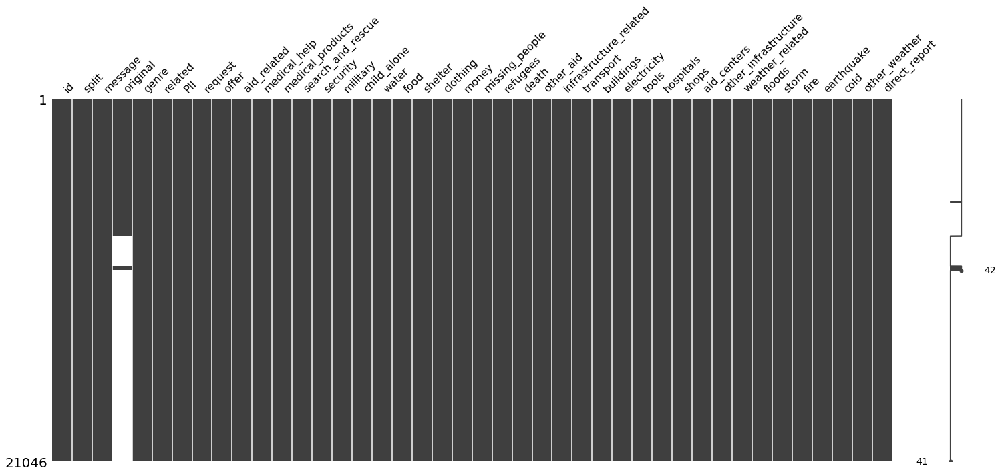

In [7]:
# Lets use missing_values function to explore train dataset
missing_values(train_df)

Number of records with missing messages: 0
Number of records with missing original: 1623
0.0% of messages values are missing from Total Number of Records.
62.0% of original values are missing from Total Number of Records.


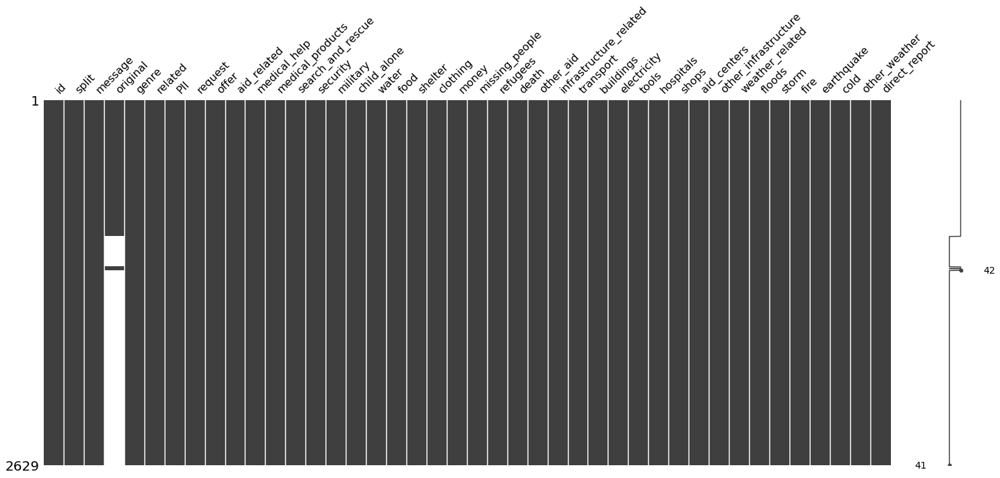

In [8]:
# Lets use missing_values function to explore train dataset
missing_values(test_df);

In [9]:
#Lets visulaize dataframe features using charts
def feature_viz(df,feature):
    
    '''Input- df=pandas dataframe
              feature= column to be charted
       Output- bar and scatter chart using plotly       
    
    '''
    #Visualize the feature
    if feature=='related':
        sns.countplot(feature, data=df)
        print('Target of 0 is {} % of total'.format(round(df[feature].value_counts()[0]/len(df[feature])*100)))
        print('Target of 1 is {} % of total'.format(round(df[feature].value_counts()[1]/len(df[feature])*100)))
        print('Target of 2 is {} % of total'.format(round(df[feature].value_counts()[2]/len(df[feature])*100)))
    else:
        #Distinct keywords in train dataset
        feat=df[feature].value_counts()
        print(feat.head())
        fig = px.scatter(feat, x=feat.values, y=feat.index,size=feat.values)
        fig.show()

Target of 0 is 24.0 % of total
Target of 1 is 75.0 % of total
Target of 2 is 1.0 % of total


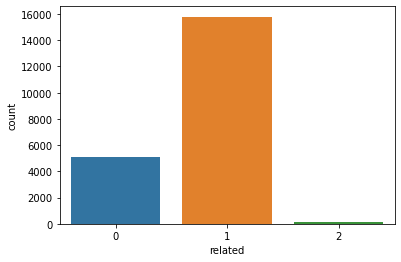

In [10]:
#Lets use feature_viz function to create charts for 'target' column
feature_viz(train_df,'related')

In [11]:
#Lets use feature_viz function to create charts for 'keyword' column
feature_viz(train_df,'message')

What is the address of the radio station? I ask because I need to drop off a file for the committee we created. Thanks in advance!    2
They reported sporadic rains were still flooding air fields, roads and slowing urgent repairs along several key highways.             2
I would like to find some informations about these questions that i asked.                                                            2
jel2  Acte 5: 29 2chr7 Lev11 Ecl9 Ecl4 jos5 ch102kr Es59                                                                              2
here,i'm i don't find medicin just resting to die where i can find it?                                                                2
Name: message, dtype: int64


In [12]:
train_df.loc[train_df['message'].str.contains('disaster', na=False, case=False)].related.value_counts()

1    410
0     24
2      1
Name: related, dtype: int64

In [13]:
#Lets use feature_viz function to create charts for 'location' column
feature_viz(train_df,'original')

Un front froid se retrouve sur Cuba ce matin. Il pourrait traverser Haiti demain. Des averses de pluie isolee sont encore prevues sur notre region ce soi    17
Nap fe ou konnen ke apati de jodi a sevis SMS 4636 pou enfomasyon ijan                                                                                       14
4636 : Nasyonzini di ou men m retire kounye a tout fatra ak gravwa nan#                                                                                       5
Chak 1 h 2 tan, mande gras, padon, mizerikod pou Ayiti! Fl ak lafwa, sel Bondye ki ka retire nou nan sa. .. Voye mesaj sa pou 10 lot moun!                    5
Si gen tant kap distribiye, fe tout sa nou ka f, poum ka jwenn younn svp.                                                                                     5
Name: original, dtype: int64


In [14]:
# Drop the column 'location' from the training dataset
train_df=train_df.drop(['original'],axis=1)

In [15]:
# Lets find the length of the 'text' for each row and add a new cloumn to train dataframe 
train_df['text_length'] = train_df['message'].apply(lambda x : len(x))
train_df.head(4)

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,text_length
0,2,train,Weather update - a cold front from Cuba that c...,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,66
1,7,train,Is the Hurricane over or is it not over,direct,1,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,39
2,12,train,"says: west side of Haiti, rest of the country ...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,63
3,14,train,Information about the National Palace-,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,38


In [16]:
train_df.text_length.describe()

count    21046.000000
mean       143.878267
std        200.674488
min          4.000000
25%         74.000000
50%        124.000000
75%        179.000000
max      10818.000000
Name: text_length, dtype: float64

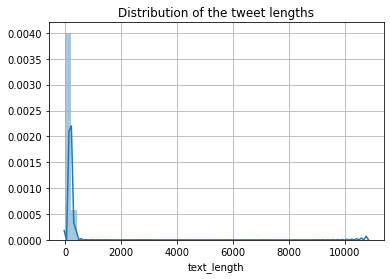

In [17]:
#Create distribution chart to visualize text length distribution
ax=sns.distplot(train_df['text_length']).set_title('Distribution of the tweet lengths');
plt.grid(True)

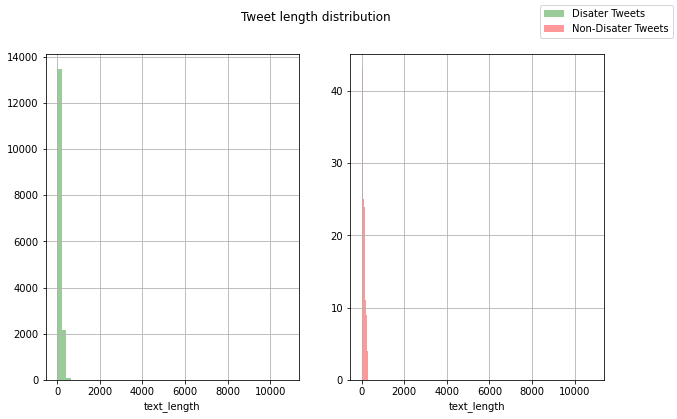

In [18]:
f, (ax1, ax2) = plt.subplots(1, 2, sharex=True,figsize=(10,6))
sns.distplot(train_df[(train_df['related'] == 1)]['text_length'], ax=ax1, kde=False, color='green',label='Disater Tweets')
sns.distplot(train_df[(train_df['related'] == 2)]['text_length'],ax=ax2, kde=False, color='red',label='Non-Disater Tweets');
f.suptitle('Tweet length distribution')
f.legend(loc='upper right')
ax1.grid()
ax2.grid()
plt.show()

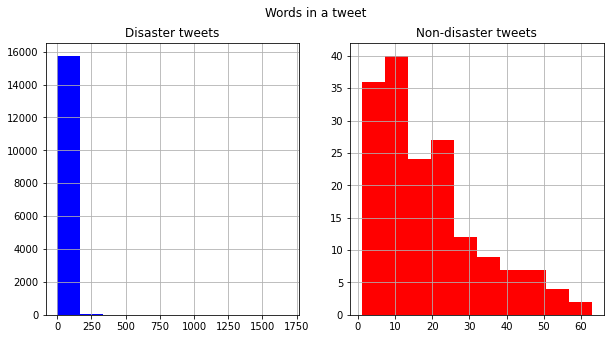

In [19]:
#Create visualization of the distribution of the word counts in comparision to target feature
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,5))
dis_tweet=train_df[train_df['related']==1]['message'].str.split().map(lambda x: len(x))
ax1.hist(dis_tweet,color='blue')
ax1.set_title('Disaster tweets')
ax1.grid()
nondis_tweet=train_df[train_df['related']==2]['message'].str.split().map(lambda x: len(x))
ax2.hist(nondis_tweet,color='red')
ax2.set_title('Non-disaster tweets')
ax2.grid()
fig.suptitle('Words in a tweet')
plt.show()

In [20]:
# A disaster tweet exmaple
train_df[train_df['related']==1]['message'][10:20]

13    We need food and water in Klecin 12. We are dy...
15    I would like to know if the earthquake is over...
16    I would like to know if one of the radio ginen...
17                       I'm in Laplaine, I am a victim
18    There's a lack of water in Moleya, please info...
19    Those people who live at Sibert need food they...
20    I want to say hello, my message is to let you ...
22    How can we get water and food in Fontamara 43 ...
23    We need help. Carrefour has been forgotten com...
25    We have a lot of problem at Delma 75 Avenue Al...
Name: message, dtype: object

In [21]:
#A non-disaster tweet example
train_df[train_df['related']==0]['message'][10:20]

66     I can play carnaval Anbasad Camp there I think...
68     ples give us cell cards ( cell phone minuts ) ...
72         good people help us. god bless you and us too
79          Digicel let me go through, it's an emergency
80                 Where can I find Capital Bank please?
84     URGENT ACTION NEEDED --this is follow up from ...
85                Please add airtime on my phone. Thanks
94     City that i'm near is Port-au Prince for me 'm...
99     I don't know Rue du Muguet, Route de Desprez 7...
108    We have a commitee from Santo 15 nameAjeans: Y...
Name: message, dtype: object

In [22]:
#Lets have a quick look of the text data
train_df['message'][:5]

0    Weather update - a cold front from Cuba that c...
1              Is the Hurricane over or is it not over
2    says: west side of Haiti, rest of the country ...
3               Information about the National Palace-
4                       Storm at sacred heart of jesus
Name: message, dtype: object

In [23]:
# Create a function to clean the text

def clean_text(text):

    '''
    Input- 'text' to be cleaned
       
       Output- Convert input 'text' to lowercase,remove square brackets,links,punctuation
       and words containing numbers. Return clean text.
    
    '''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [24]:
# Lets apply the clean_text function to both test and training datasets copies
train_df1=train_df.copy()
test_df1=test_df.copy()
train_df1['message'] = train_df1['message'].apply(lambda x: clean_text(x))
test_df1['message'] = test_df1['message'].apply(lambda x: clean_text(x))

In [25]:
#Lets look cleaned text data
def text_after_preprocess(before_text,after_text):
    
    '''
    Input- before_text=text column before cleanup
              after_text= text column after cleanup
       Output- print before and after text to compare how it looks after cleanup
       
    '''
    print('-'*60)
    print('Text before cleanup')
    print('-'*60)
    print(before_text.head(5))
    print('-'*60)
    print('Text after cleanup')
    print('-'*60)
    print(after_text.head(5))

In [26]:
text_after_preprocess(train_df.message,train_df1.message)

------------------------------------------------------------
Text before cleanup
------------------------------------------------------------
0    Weather update - a cold front from Cuba that c...
1              Is the Hurricane over or is it not over
2    says: west side of Haiti, rest of the country ...
3               Information about the National Palace-
4                       Storm at sacred heart of jesus
Name: message, dtype: object
------------------------------------------------------------
Text after cleanup
------------------------------------------------------------
0    weather update  a cold front from cuba that co...
1              is the hurricane over or is it not over
2    says west side of haiti rest of the country to...
3                information about the national palace
4                       storm at sacred heart of jesus
Name: message, dtype: object


In [27]:
text_after_preprocess(test_df.message,test_df1.message)

------------------------------------------------------------
Text before cleanup
------------------------------------------------------------
0    UN reports Leogane 80-90 destroyed. Only Hospi...
1    We are at Gressier we needs assistance right a...
2                       Delmas 33 in Silo, need water.
3    SOS SOS, please provide police officers on the...
4          I am a driver, a mechanic ,. I want to help
Name: message, dtype: object
------------------------------------------------------------
Text after cleanup
------------------------------------------------------------
0    un reports leogane  destroyed only hospital st...
1    we are at gressier we needs assistance right a...
2                           delmas  in silo need water
3    sos sos please provide police officers on the ...
4             i am a driver a mechanic  i want to help
Name: message, dtype: object


In [28]:
test_df.message[1]

'We are at Gressier we needs assistance right away. ASAP, Come help us.'

In [29]:
# Example how tokenization of text works
text = "Heard about #earthquake is different cities, stay safe everyone."
tokenizer1 = nltk.tokenize.WhitespaceTokenizer()
tokenizer2 = nltk.tokenize.TreebankWordTokenizer()
tokenizer3 = nltk.tokenize.WordPunctTokenizer()
tokenizer4 = nltk.tokenize.RegexpTokenizer(r'\w+')
print("-"*100)
print("Example Text: ",text)
print("-"*100)
print("Tokenization by whitespace:- ",tokenizer1.tokenize(text))
print("Tokenization by words using Treebank Word Tokenizer:- ",tokenizer2.tokenize(text))
print("Tokenization by punctuation:- ",tokenizer3.tokenize(text))
print("Tokenization by regular expression:- ",tokenizer4.tokenize(text))

----------------------------------------------------------------------------------------------------
Example Text:  Heard about #earthquake is different cities, stay safe everyone.
----------------------------------------------------------------------------------------------------
Tokenization by whitespace:-  ['Heard', 'about', '#earthquake', 'is', 'different', 'cities,', 'stay', 'safe', 'everyone.']
Tokenization by words using Treebank Word Tokenizer:-  ['Heard', 'about', '#', 'earthquake', 'is', 'different', 'cities', ',', 'stay', 'safe', 'everyone', '.']
Tokenization by punctuation:-  ['Heard', 'about', '#', 'earthquake', 'is', 'different', 'cities', ',', 'stay', 'safe', 'everyone', '.']
Tokenization by regular expression:-  ['Heard', 'about', 'earthquake', 'is', 'different', 'cities', 'stay', 'safe', 'everyone']


In [30]:
# Lets Tokenize the training and the test dataset copies with RegEx tokenizer
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
train_df1['message'] = train_df1['message'].apply(lambda x: tokenizer.tokenize(x))
test_df1['message'] = test_df1['message'].apply(lambda x: tokenizer.tokenize(x))

In [31]:
#Lets checy tokenized text
train_df1['message'].head()

0    [weather, update, a, cold, front, from, cuba, ...
1    [is, the, hurricane, over, or, is, it, not, over]
2    [says, west, side, of, haiti, rest, of, the, c...
3          [information, about, the, national, palace]
4                [storm, at, sacred, heart, of, jesus]
Name: message, dtype: object

In [32]:
test_df1['message'].head()

0    [un, reports, leogane, destroyed, only, hospit...
1    [we, are, at, gressier, we, needs, assistance,...
2                      [delmas, in, silo, need, water]
3    [sos, sos, please, provide, police, officers, ...
4    [i, am, a, driver, a, mechanic, i, want, to, h...
Name: message, dtype: object

In [33]:
#Create a funtion to remove stopwords
def remove_stopwords(text):
    
    """
    Input- text=text from which english stopwprds will be removed
    Output- return text without english stopwords 
    
    """
    words = [w for w in text if w not in stopwords.words('english')]
    return words

In [34]:
train_df1['message'] = train_df1['message'].apply(lambda x : remove_stopwords(x))
test_df1['message'] = test_df1['message'].apply(lambda x : remove_stopwords(x))

In [35]:
train_df1.message.head()

0    [weather, update, cold, front, cuba, could, pa...
1                                          [hurricane]
2    [says, west, side, haiti, rest, country, today...
3                      [information, national, palace]
4                        [storm, sacred, heart, jesus]
Name: message, dtype: object

In [36]:
test_df1.message.head()

0    [un, reports, leogane, destroyed, hospital, st...
1    [gressier, needs, assistance, right, away, asa...
2                          [delmas, silo, need, water]
3    [sos, sos, please, provide, police, officers, ...
4                       [driver, mechanic, want, help]
Name: message, dtype: object

In [37]:
# Stemming and Lemmatization examples
text =  "ran deduced dogs talking studies"

tokenizer = nltk.tokenize.TreebankWordTokenizer()
tokens = tokenizer.tokenize(text)

# Stemmer
stemmer = nltk.stem.PorterStemmer()
print("Stemming the sentence: ", " ".join(stemmer.stem(token) for token in tokens))

# Lemmatizer
lemmatizer=nltk.stem.WordNetLemmatizer()
print("Lemmatizing the sentence: ", " ".join(lemmatizer.lemmatize(token) for token in tokens))

Stemming the sentence:  ran deduc dog talk studi
Lemmatizing the sentence:  ran deduced dog talking study


In [38]:
# Lets combine text after processing it
def combine_text(text):
    
    '''
    Input-text= list cleand and tokenized text
    Output- Takes a list of text and returns combined one large chunk of text.
    
    '''
    all_text = ' '.join(text)
    return all_text

In [39]:
train_df1['message'] = train_df1['message'].apply(lambda x : combine_text(x))
test_df1['message'] = test_df1['message'].apply(lambda x : combine_text(x))

In [40]:
train_df1.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,text_length
0,2,train,weather update cold front cuba could pass haiti,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,66
1,7,train,hurricane,direct,1,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,39
2,12,train,says west side haiti rest country today tonight,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,63
3,14,train,information national palace,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,38
4,15,train,storm sacred heart jesus,direct,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,30


In [41]:
# Create a function to pre-process the tweets
def pre_process_text_combined(text):
    
    """
    Input- text= text to be pre-processed
    
    Oputput- return cleaned and combined text to be vectrorized for Machine learning.

    """
    #Initiate a tokenizer
    tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
    # Clean the text using clean_text function
    cleaned_txt = clean_text(text)
    tokenized_text = tokenizer.tokenize(cleaned_txt)
    remove_stopwords = [w for w in tokenized_text if w not in stopwords.words('english')]
    combined_text = ' '.join(remove_stopwords)
    return  combined_text

In [42]:
# Create a function to pre-process the tweets
def pre_process_text(text):
    """
    Input- text= text to be pre-processed
    
    Oputput- return cleaned text to be vectrorized for Machine learning.

    """
    #Initiate a tokenizer
    tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
    # Clean the text using clean_text function
    cleaned_txt = clean_text(text)
    tokenized_text = tokenizer.tokenize(cleaned_txt)
    remove_stopwords = [w for w in tokenized_text if w not in stopwords.words('english')]
    return remove_stopwords

In [43]:
# Text before pre-processing
train_df.message.head()

0    Weather update - a cold front from Cuba that c...
1              Is the Hurricane over or is it not over
2    says: west side of Haiti, rest of the country ...
3               Information about the National Palace-
4                       Storm at sacred heart of jesus
Name: message, dtype: object

In [44]:
# Lets pre-process train data text
train_df2=train_df.copy()
train_df2['message'] = train_df2['message'].apply(lambda x : pre_process_text_combined(x))

In [45]:
# Text after pre-processing the text column
train_df2.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,text_length
0,2,train,weather update cold front cuba could pass haiti,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,66
1,7,train,hurricane,direct,1,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,39
2,12,train,says west side haiti rest country today tonight,direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,63
3,14,train,information national palace,direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,38
4,15,train,storm sacred heart jesus,direct,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,30


In [46]:
# Lets pre-process test data text
test_df2=test_df.copy()
test_df2['message'] = test_df2['message'].apply(lambda x : pre_process_text_combined(x))

In [47]:
# Text after pre-processing the text column
test_df2.head(10)

,id,split,message,original,genre,related,PII,request,offer,aid_related,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,9,test,un reports leogane destroyed hospital st croix...,UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
1,39,test,gressier needs assistance right away asap come...,Se gressier nou an difikilte tanpri vin ede nou,direct,1,0,1,0,1,...,0,0,1,1,0,0,0,0,0,1
2,49,test,delmas silo need water,Delma 33 silo gen problem dlo,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
3,79,test,sos sos please provide police officers streets...,EMGENCY EMGENCY SI POLIS LA TE KA BAY PREZANS ...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
4,99,test,driver mechanic want help,"MWEN SE YON NMALIEN, CHOF, MEKANISYEN MWEN BEZ...",direct,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5,119,test,fort mercredi wednesday find tents treated water,Nous sommes Fort - Mercredi Ou on peux trouve...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
6,129,test,imcomprehensibley member repatriated incompreh...,asyon de 9 manb nou nan rapatriye zon la plan ...,direct,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,139,test,cold front cuba morning could cross haiti tomo...,Un front froid se retrouve sur Cuba ce matin. ...,direct,1,0,0,0,0,...,0,0,1,0,1,0,0,1,0,0
8,149,test,please bo gravel vob ta hungry need food,SVP BO GRAVEL VOB TAA 41 NOU GRANGOU,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
9,159,test,located one place want know lot available spac...,ske se pa yon sel kote nou ye epi map fe nou k...,direct,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1


In [48]:
# Lets pre-process train data text
train_df3=train_df.copy()
train_df3['message'] = train_df3['message'].apply(lambda x : pre_process_text(x))

In [49]:
train_df3.head()

,id,split,message,genre,related,PII,request,offer,aid_related,medical_help,...,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report,text_length
0,2,train,"[weather, update, cold, front, cuba, could, pa...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,66
1,7,train,[hurricane],direct,1,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,39
2,12,train,"[says, west, side, haiti, rest, country, today...",direct,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,63
3,14,train,"[information, national, palace]",direct,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,38
4,15,train,"[storm, sacred, heart, jesus]",direct,1,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,30


In [50]:
# Lets pre-process train data text
test_df3=test_df.copy()
test_df3['message'] = test_df3['message'].apply(lambda x : pre_process_text(x))

In [51]:
test_df3.head()

,id,split,message,original,genre,related,PII,request,offer,aid_related,...,aid_centers,other_infrastructure,weather_related,floods,storm,fire,earthquake,cold,other_weather,direct_report
0,9,test,"[un, reports, leogane, destroyed, hospital, st...",UN reports Leogane 80-90 destroyed. Only Hospi...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
1,39,test,"[gressier, needs, assistance, right, away, asa...",Se gressier nou an difikilte tanpri vin ede nou,direct,1,0,1,0,1,...,0,0,1,1,0,0,0,0,0,1
2,49,test,"[delmas, silo, need, water]",Delma 33 silo gen problem dlo,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
3,79,test,"[sos, sos, please, provide, police, officers, ...",EMGENCY EMGENCY SI POLIS LA TE KA BAY PREZANS ...,direct,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,1
4,99,test,"[driver, mechanic, want, help]","MWEN SE YON NMALIEN, CHOF, MEKANISYEN MWEN BEZ...",direct,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


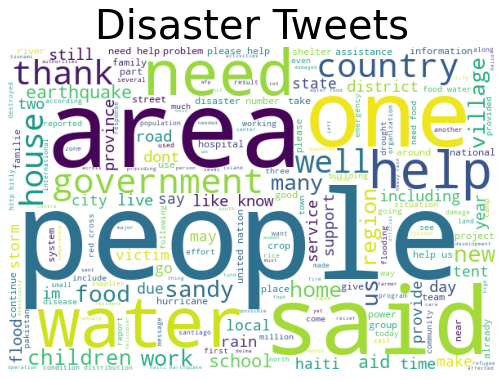

In [52]:
#Lets have a quick look of the tweets in wordcloud
from wordcloud import WordCloud
fig, ax = plt.subplots(figsize=[10, 6])
wordcloud = WordCloud( background_color='white',
                        width=600,
                        height=400).generate(" ".join(train_df2.message))
ax.imshow(wordcloud)
ax.axis('off')
ax.set_title('Disaster Tweets',fontsize=40);

In [53]:
# Vectorize the text using CountVectorizer
count_vectorizer = CountVectorizer()
train_cv = count_vectorizer.fit_transform(train_df2['message'])
test_cv = count_vectorizer.transform(test_df2["message"])

## Keeping only non-zero elements to preserve space 
print(train_cv[0].todense())

[[0 0 0 ... 0 0 0]]


In [54]:
# Vectorize the text using TFIDF
tfidf = TfidfVectorizer(min_df=2, max_df=0.5, ngram_range=(1, 2))
train_tf = tfidf.fit_transform(train_df2['message'])
test_tf = tfidf.transform(test_df2["message"])

In [55]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.related,test_size=0.2,random_state=2020)

In [56]:
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))

              precision    recall  f1-score   support

           0       0.71      0.44      0.54       989
           1       0.84      0.95      0.89      3187
           2       1.00      0.06      0.11        34

    accuracy                           0.82      4210
   macro avg       0.85      0.48      0.51      4210
weighted avg       0.81      0.82      0.80      4210

Accuracy of classifier on training set:93.0%
Accuracy of classifier on test set:82.0%


In [57]:
clf_svcreg

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [58]:
# Lets apply pre-processing function to clean and pre-process text data before vectorizing
test_df_final=test_df.copy()
test_df_final['message'] = test_df_final['message'].apply(lambda x : pre_process_text_combined(x))

In [59]:
# Lets fit the test data with Countvectorizer() method to vectroize the data
test_vector = count_vectorizer.transform(test_df_final["message"])

In [60]:
def submission(sub_file,model,test_vector,field):
    
    '''Input- sub_file=Location of the file submission file
              model=final fit model to be used for predictions
              test_vector=pre-processed and vectorized test dataset
       Output- submission file in .csv format with predictions       
    
    '''
    sub_df = pd.read_csv(sub_file)
    sub_df[field] = model.predict(test_vector)
    sub_df.to_csv("submission.csv", index=False)

In [61]:
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "related"
submission(sub_file,clf_svcreg,test_vector,test_field)

In [62]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.medical_help,test_size=0.2,random_state=2020)

In [63]:
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3894
           1       0.68      0.08      0.14       316

    accuracy                           0.93      4210
   macro avg       0.80      0.54      0.55      4210
weighted avg       0.91      0.93      0.90      4210

Accuracy of classifier on training set:97.0%
Accuracy of classifier on test set:93.0%


In [64]:
def submission(sub_file,model,test_vector,field):
    
    '''Input- sub_file=Location of the file submission file
              model=final fit model to be used for predictions
              test_vector=pre-processed and vectorized test dataset
       Output- submission file in .csv format with predictions       
    
    '''
    sub_df = pd.read_csv(sub_file)
    sub_df[field] = model.predict(test_vector)
    sub_df.to_csv("submission.csv", index=False)

In [65]:
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "medical_help"
submission(sub_file,clf_svcreg,test_vector,test_field)

In [66]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.medical_products,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "medical_products"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3998
           1       0.77      0.11      0.19       212

    accuracy                           0.95      4210
   macro avg       0.86      0.55      0.58      4210
weighted avg       0.95      0.95      0.94      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:95.0%


In [67]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.search_and_rescue,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "search_and_rescue"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      1.00      0.99      4087
           1       0.56      0.04      0.08       123

    accuracy                           0.97      4210
   macro avg       0.76      0.52      0.53      4210
weighted avg       0.96      0.97      0.96      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:97.0%


In [68]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.security,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "security"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4146
           1       0.00      0.00      0.00        64

    accuracy                           0.98      4210
   macro avg       0.49      0.50      0.50      4210
weighted avg       0.97      0.98      0.98      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:98.0%


In [69]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.military,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "military"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      4083
           1       0.50      0.01      0.02       127

    accuracy                           0.97      4210
   macro avg       0.74      0.50      0.50      4210
weighted avg       0.96      0.97      0.96      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:97.0%


In [70]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.water,test_size=0.2,random_state=2020)

In [71]:
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "water"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3934
           1       0.84      0.50      0.63       276

    accuracy                           0.96      4210
   macro avg       0.90      0.75      0.80      4210
weighted avg       0.96      0.96      0.96      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:96.0%


In [72]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.food,test_size=0.2,random_state=2020)

In [73]:
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "food"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      3707
           1       0.78      0.59      0.67       503

    accuracy                           0.93      4210
   macro avg       0.86      0.78      0.82      4210
weighted avg       0.93      0.93      0.93      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:93.0%


In [74]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.shelter,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "shelter"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.94      0.99      0.96      3810
           1       0.82      0.39      0.53       400

    accuracy                           0.93      4210
   macro avg       0.88      0.69      0.75      4210
weighted avg       0.93      0.93      0.92      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:93.0%


In [75]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.clothing,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "clothing"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4148
           1       0.84      0.34      0.48        62

    accuracy                           0.99      4210
   macro avg       0.92      0.67      0.74      4210
weighted avg       0.99      0.99      0.99      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:99.0%


In [76]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.money,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "money"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4116
           1       0.67      0.02      0.04        94

    accuracy                           0.98      4210
   macro avg       0.82      0.51      0.52      4210
weighted avg       0.97      0.98      0.97      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:98.0%


In [77]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.missing_people,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "missing_people"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4156
           1       0.00      0.00      0.00        54

    accuracy                           0.99      4210
   macro avg       0.49      0.50      0.50      4210
weighted avg       0.97      0.99      0.98      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:99.0%


In [78]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.refugees,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "refugees"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      4072
           1       0.80      0.06      0.11       138

    accuracy                           0.97      4210
   macro avg       0.88      0.53      0.55      4210
weighted avg       0.96      0.97      0.96      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:97.0%


In [79]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.death,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "death"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      4018
           1       0.83      0.36      0.50       192

    accuracy                           0.97      4210
   macro avg       0.90      0.68      0.74      4210
weighted avg       0.96      0.97      0.96      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:97.0%


In [80]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.other_aid,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "other_aid"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      3633
           1       0.68      0.05      0.09       577

    accuracy                           0.87      4210
   macro avg       0.78      0.52      0.51      4210
weighted avg       0.84      0.87      0.81      4210

Accuracy of classifier on training set:93.0%
Accuracy of classifier on test set:87.0%


In [81]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.infrastructure_related,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "infrastructure_related"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3911
           1       0.00      0.00      0.00       299

    accuracy                           0.93      4210
   macro avg       0.46      0.50      0.48      4210
weighted avg       0.86      0.93      0.89      4210

Accuracy of classifier on training set:96.0%
Accuracy of classifier on test set:93.0%


In [82]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.transport,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "transport"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4027
           1       0.76      0.09      0.16       183

    accuracy                           0.96      4210
   macro avg       0.86      0.54      0.57      4210
weighted avg       0.95      0.96      0.94      4210

Accuracy of classifier on training set:97.0%
Accuracy of classifier on test set:96.0%


In [83]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.buildings,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "buildings"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4002
           1       0.77      0.18      0.29       208

    accuracy                           0.96      4210
   macro avg       0.86      0.59      0.63      4210
weighted avg       0.95      0.96      0.94      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:96.0%


In [84]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.electricity,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "electricity"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4129
           1       0.75      0.11      0.19        81

    accuracy                           0.98      4210
   macro avg       0.87      0.56      0.59      4210
weighted avg       0.98      0.98      0.98      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:98.0%


In [85]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.tools,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "tools"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4184
           1       0.00      0.00      0.00        26

    accuracy                           0.99      4210
   macro avg       0.50      0.50      0.50      4210
weighted avg       0.99      0.99      0.99      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:99.0%


In [86]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.hospitals,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "hospitals"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4178
           1       0.00      0.00      0.00        32

    accuracy                           0.99      4210
   macro avg       0.50      0.50      0.50      4210
weighted avg       0.98      0.99      0.99      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:99.0%


In [87]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.shops,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "shops"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      4188
           1       0.00      0.00      0.00        22

    accuracy                           0.99      4210
   macro avg       0.50      0.50      0.50      4210
weighted avg       0.99      0.99      0.99      4210

Accuracy of classifier on training set:100.0%
Accuracy of classifier on test set:99.0%


In [88]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.aid_centers,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "aid_centers"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4143
           1       0.00      0.00      0.00        67

    accuracy                           0.98      4210
   macro avg       0.49      0.50      0.50      4210
weighted avg       0.97      0.98      0.98      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:98.0%


In [89]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.other_infrastructure,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "other_infrastructure"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3996
           1       0.00      0.00      0.00       214

    accuracy                           0.95      4210
   macro avg       0.47      0.50      0.49      4210
weighted avg       0.90      0.95      0.92      4210

Accuracy of classifier on training set:97.0%
Accuracy of classifier on test set:95.0%


In [90]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.weather_related,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "weather_related"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.87      0.97      0.91      3024
           1       0.88      0.62      0.73      1186

    accuracy                           0.87      4210
   macro avg       0.87      0.80      0.82      4210
weighted avg       0.87      0.87      0.86      4210

Accuracy of classifier on training set:95.0%
Accuracy of classifier on test set:87.0%


In [91]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.floods,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "floods"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3861
           1       0.89      0.36      0.52       349

    accuracy                           0.94      4210
   macro avg       0.92      0.68      0.74      4210
weighted avg       0.94      0.94      0.93      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:94.0%


In [92]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.storm,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "storm"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.94      0.99      0.96      3787
           1       0.82      0.43      0.57       423

    accuracy                           0.93      4210
   macro avg       0.88      0.71      0.77      4210
weighted avg       0.93      0.93      0.92      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:93.0%


In [93]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.fire,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "fire"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      4166
           1       0.33      0.02      0.04        44

    accuracy                           0.99      4210
   macro avg       0.66      0.51      0.52      4210
weighted avg       0.98      0.99      0.98      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:99.0%


In [94]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.earthquake,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "earthquake"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3813
           1       0.90      0.68      0.77       397

    accuracy                           0.96      4210
   macro avg       0.93      0.83      0.88      4210
weighted avg       0.96      0.96      0.96      4210

Accuracy of classifier on training set:98.0%
Accuracy of classifier on test set:96.0%


In [95]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.cold,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "cold"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      4122
           1       0.80      0.09      0.16        88

    accuracy                           0.98      4210
   macro avg       0.89      0.55      0.58      4210
weighted avg       0.98      0.98      0.97      4210

Accuracy of classifier on training set:99.0%
Accuracy of classifier on test set:98.0%


In [96]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.other_weather,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "other_weather"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3988
           1       1.00      0.01      0.02       222

    accuracy                           0.95      4210
   macro avg       0.97      0.50      0.50      4210
weighted avg       0.95      0.95      0.92      4210

Accuracy of classifier on training set:97.0%
Accuracy of classifier on test set:95.0%


In [98]:
#Split the CountVector vectorized data into train and test datasets for model training and testing
X_train_cv, X_test_cv, y_train_cv, y_test_cv =train_test_split(train_cv,train_df.aid_related,test_size=0.2,random_state=2020)
# Fitting 'SVC()' with CountVectorizer() fit dataset
clf_svcreg = SVC()
clf_svcreg.fit(X_train_cv, y_train_cv)
pred=clf_svcreg.predict(X_test_cv)
confusion_matrix(y_test_cv,pred)
print(classification_report(y_test_cv,pred))
print('Accuracy of classifier on training set:{}%'.format(round(clf_svcreg.score(X_train_cv, y_train_cv)*100)))
print('Accuracy of classifier on test set:{}%' .format(round(accuracy_score(y_test_cv,pred)*100)))
# Use Submission() function to generate submission file for posting on Kaggle
sub_file = "/Users/siddharth/Desktop/Disaster/aid/disaster_response_messages_test.csv"
test_vector=test_vector
test_field = "aid_related"
submission(sub_file,clf_svcreg,test_vector,test_field)

              precision    recall  f1-score   support

           0       0.77      0.87      0.82      2472
           1       0.77      0.64      0.70      1738

    accuracy                           0.77      4210
   macro avg       0.77      0.75      0.76      4210
weighted avg       0.77      0.77      0.77      4210

Accuracy of classifier on training set:94.0%
Accuracy of classifier on test set:77.0%
